In [1]:
import ImageView: imshow
import Images: Gray
import TestImages: testimage

In [2]:
typeof(1.0)

Float64

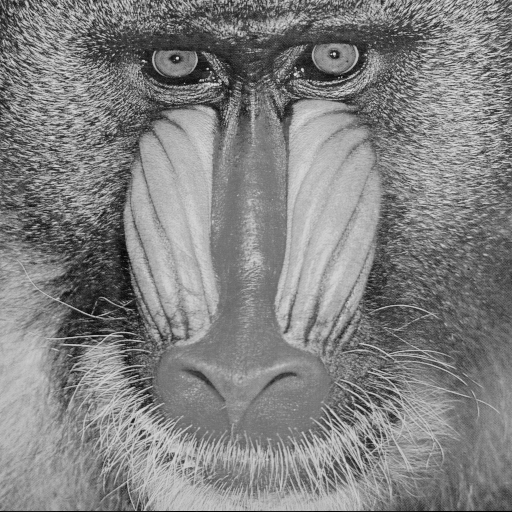

In [3]:
mandrill = 1.0*Gray.(testimage("mandrill"))

In [4]:
typeof(mandrill)

Matrix{Gray{Float64}} (alias for Array{Gray{Float64}, 2})

In [5]:
function normalize_image(im)
    im_res = im .- minimum(im)
    return (1/maximum(im_res))*im_res
end

normalize_image (generic function with 1 method)

In [6]:
m = convert(Matrix{Float64}, mandrill)

512×512 Matrix{Float64}:
 0.568627   0.219608   0.192157   0.34902   …  0.443137  0.6        0.694118
 0.454902   0.396078   0.156863   0.262745     0.509804  0.584314   0.490196
 0.301961   0.447059   0.180392   0.180392     0.392157  0.345098   0.317647
 0.278431   0.533333   0.372549   0.188235     0.286275  0.294118   0.27451
 0.341176   0.478431   0.517647   0.196078     0.231373  0.313725   0.337255
 0.321569   0.298039   0.623529   0.239216  …  0.333333  0.596078   0.713725
 0.168627   0.2        0.52549    0.509804     0.72549   0.776471   0.643137
 0.129412   0.2        0.435294   0.6          0.631373  0.470588   0.541176
 0.223529   0.188235   0.219608   0.458824     0.529412  0.611765   0.478431
 0.14902    0.12549    0.188235   0.25098      0.254902  0.317647   0.533333
 0.129412   0.168627   0.223529   0.145098  …  0.254902  0.286275   0.266667
 0.129412   0.184314   0.305882   0.141176     0.34902   0.290196   0.294118
 0.141176   0.262745   0.352941   0.254902     0.301

In [7]:
import LinearAlgebra: transpose, norm

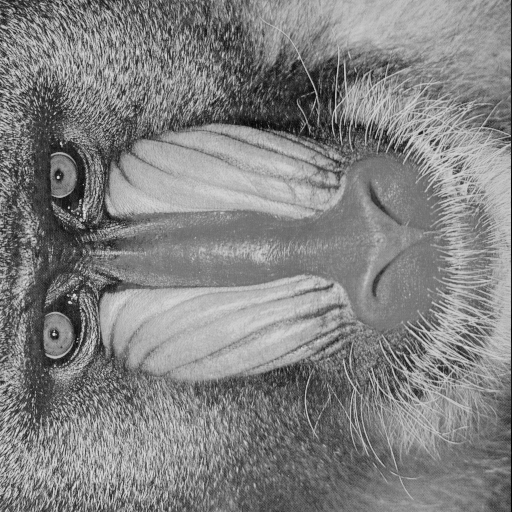

In [8]:
transpose(mandrill)

In [9]:
typeof(normalize_image(transpose(m)*m))

Matrix{Float64} (alias for Array{Float64, 2})

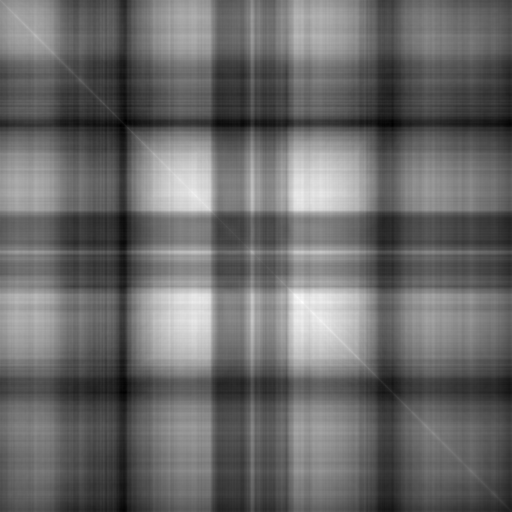

In [10]:
Gray.(normalize_image(transpose(m)*m))

In [11]:
norm_columns(f, x) = f.(x) ./ sum(f.(x), dims=1)

norm_rows(f, x) = f.(x) ./ sum(f.(x), dims=2)

norm_rows (generic function with 1 method)

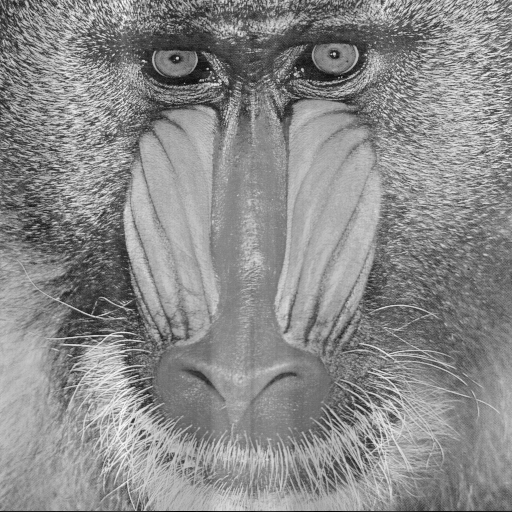

In [12]:
nc_m = normalize_image(norm_columns(x -> x+1, m))
Gray.(nc_m)

In [13]:
typeof(nc_m)

Matrix{Float64} (alias for Array{Float64, 2})

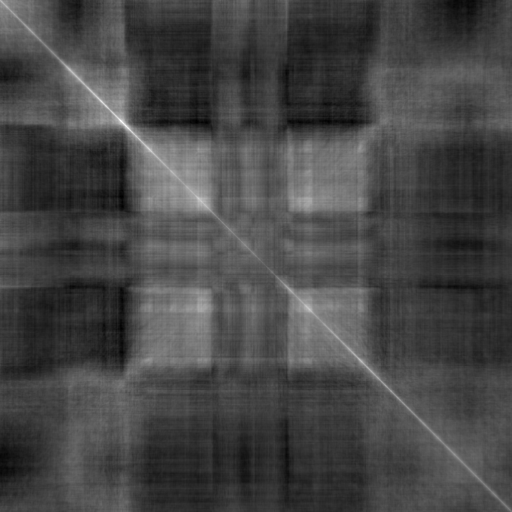

In [14]:
Gray.(normalize_image(transpose(nc_m)*nc_m))

In [15]:
function warp3(x, y, p) # 0:31
    knob = p[:knob]
    clip(n, nsize) = max(min(nsize, n), 1)
    (xnew, ynew) =
        (clip(x + 10 * ((knob - 16) / 16) * sin(y/4), p[:xsize]), y)
    xnew, ynew
end

warp3 (generic function with 1 method)

In [16]:
function apply_warp(warp, im, p)
    (xsize, ysize) = size(im)
    p[:xsize] = xsize
    p[:ysize] = ysize
    function linear_interpolation(x_y)
        # a rough draft, this can be improved; works on im
        x = x_y[1]
        y = x_y[2]
        dx=mod(x,1)
        dy=mod(y,1)
        x_left = floor(Int,x)
        y_left = floor(Int,y)
        x_right = min(x_left + 1, xsize)
        y_right = min(y_left + 1, ysize)
        im[x_left,y_left]*(1-dx)*(1-dy) + im[x_left,y_right]*(1-dx)*dy + im[x_right,y_left]*dx*(1-dy) + im[x_right, y_right]*dx*dy
    end
    [linear_interpolation(warp(x,y,p)) for x in 1:xsize, y in 1:ysize]
end

apply_warp (generic function with 1 method)

In [17]:
pars = Dict(:knob=>0, :dummy=>0.0)
# at least one of the above should be float and not integer, so that the dictionary type is
# Dict{Symbol, Real}  and not Dict{Symbol, Int64}

Dict{Symbol, Real} with 2 entries:
  :dummy => 0.0
  :knob  => 0

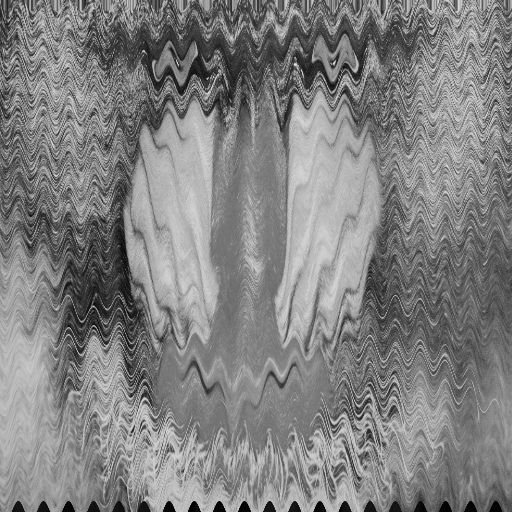

In [18]:
m_warped = apply_warp(warp3, m, pars)
Gray.(m_warped)

In [19]:
typeof(m_warped)

Matrix{Float64} (alias for Array{Float64, 2})

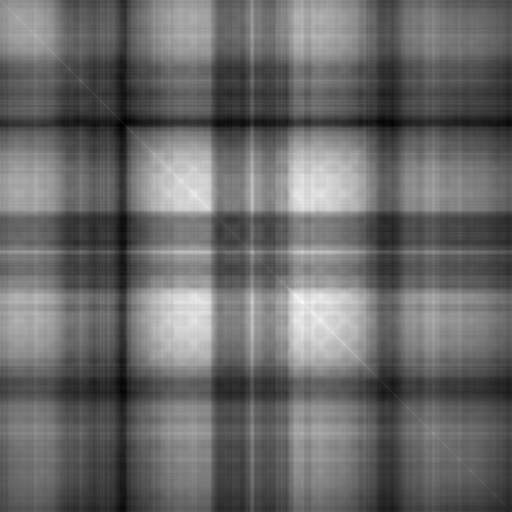

In [20]:
Gray.(normalize_image(transpose(m_warped)*m_warped))

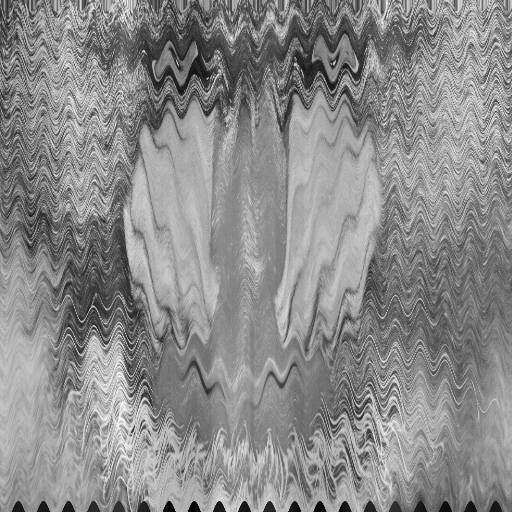

In [21]:
nc_m_warped = normalize_image(norm_columns(x -> x+1, m_warped))
Gray.(nc_m_warped)

In [22]:
typeof(nc_m_warped)

Matrix{Float64} (alias for Array{Float64, 2})

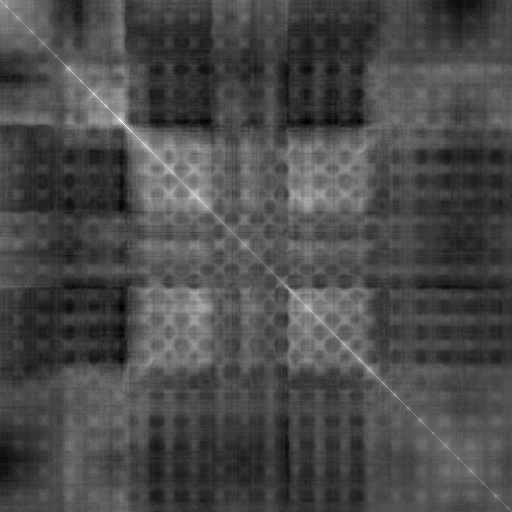

In [23]:
Gray.(normalize_image(transpose(nc_m_warped)*nc_m_warped))

In [26]:
transposed_product(x) = normalize_image(transpose(x)*x)

transposed_product (generic function with 1 method)

In [28]:
value3(A) = transposed_product(norm_columns(x -> x+1, A))

value3 (generic function with 1 method)

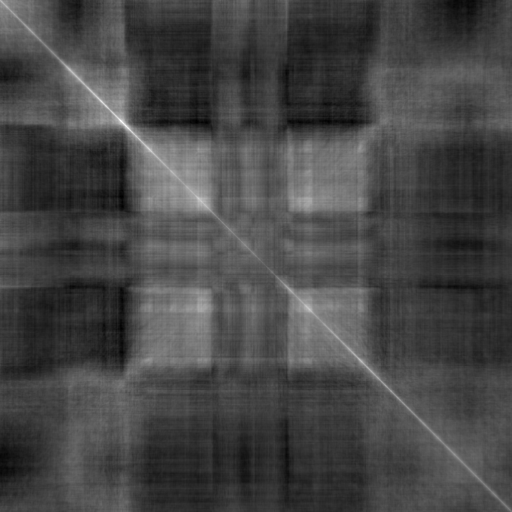

In [29]:
Gray.(value3(m))

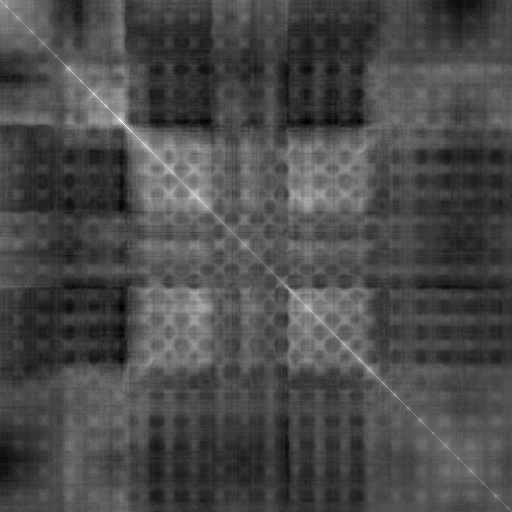

In [30]:
Gray.(value3(m_warped))

In [31]:
loss(x, y) = norm(value3(x) - y)

loss (generic function with 1 method)

In [32]:
using Flux

In [33]:
opt = Adam()

Adam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [34]:
import Flux.Optimise: update!

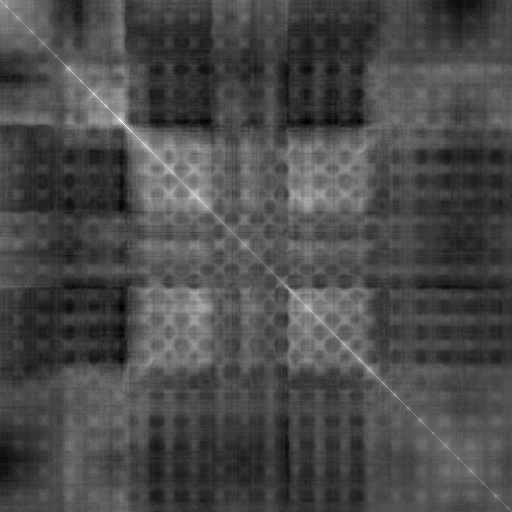

In [35]:
target_value = value3(m_warped)
Gray.(target_value)

In [36]:
loss(m, target_value)

20.398542517307735

In [37]:
# note that the above loss is different from the loss with Float32 which was 
20.400127148541408

20.400127148541408

In [38]:
using Flux: params

In [39]:
function steps!(x, y, loss, opt, accum, n_steps = 1)
    for i = 1:n_steps
        p = params(x)
        push!(accum, deepcopy(x)) # I am unhappy about the loss of intermediate parameter values
        grads = gradient(()->loss(x, y), p)
        update!(opt, p, grads)
        println(loss(x, y))
    end
    loss(x, y)
end

steps! (generic function with 2 methods)

In [40]:
m_list = []

Any[]

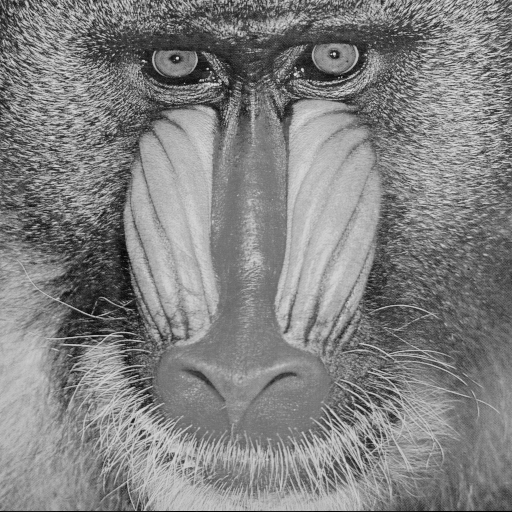

In [41]:
changing_m = deepcopy(m)
Gray.(changing_m)

In [42]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

18.93049343188407
17.998500364217367
17.491154718933867
17.13255489410031
16.85127216653478
16.592180938618803
16.324731039066375
16.04211969735054
15.752753398290832
15.470772733617547
15.208512317330024
14.971510650418326
14.756626136951025
14.553996200140098
14.352219598872992
14.143887176399575
13.928366727894394
13.711012247955294
13.499969079822442
13.302249870219642
13.12060443818115
12.952448477288916
12.791421534324723
12.630792681546374
12.466743684799539
12.299711058109121
12.133335207824292
11.971910506249172
11.817823110417638
11.670342313744733


11.670342313744733

In [43]:
length(m_list)

30

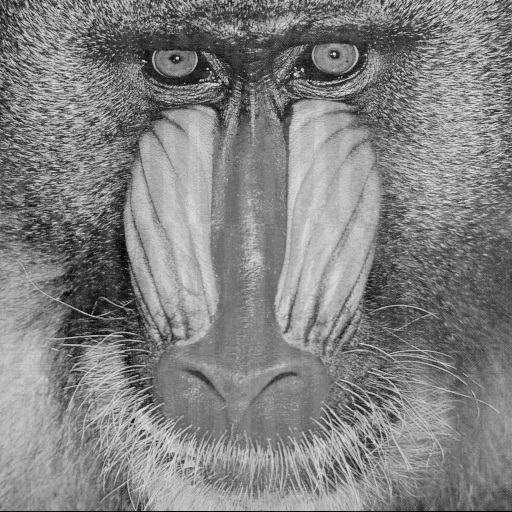

In [44]:
Gray.(changing_m)

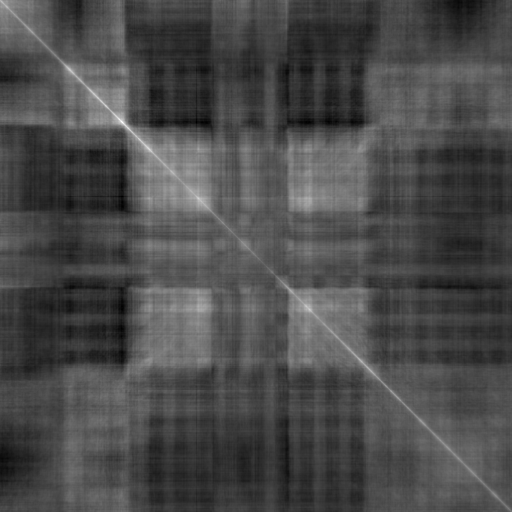

In [45]:
Gray.(value3(changing_m))

In [46]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

11.526389040242826
11.38271410969055
11.237982136961538
11.093379090533146
10.951463322094058
10.81416416388549
10.681330108168908
10.552145870322704
10.42161191345783
10.291177444607364
10.1586168129397
10.034030103319301
9.894125691107678
9.764147145693359
9.635838033871824
9.507677557248089
9.378514144034554
9.248192968017403
9.117571555702737
8.987632903286478
8.85857371796048
8.729732552335186
8.60039101021298
8.470621350467482
8.341335524608178
8.213533107678971
8.087564888819085
7.963172058775216
7.840187172376713
7.719054050002275


7.719054050002275

In [47]:
length(m_list)

60

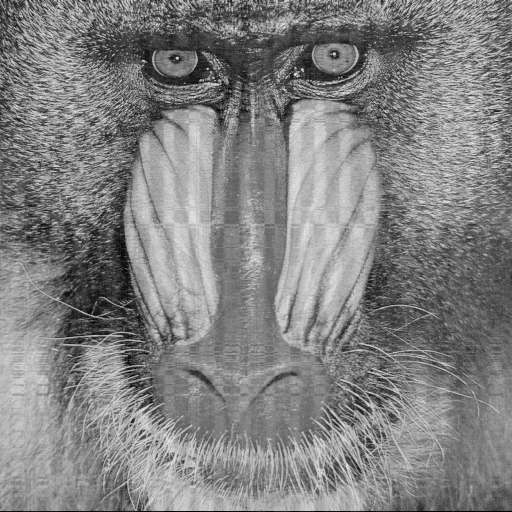

In [48]:
Gray.(changing_m)

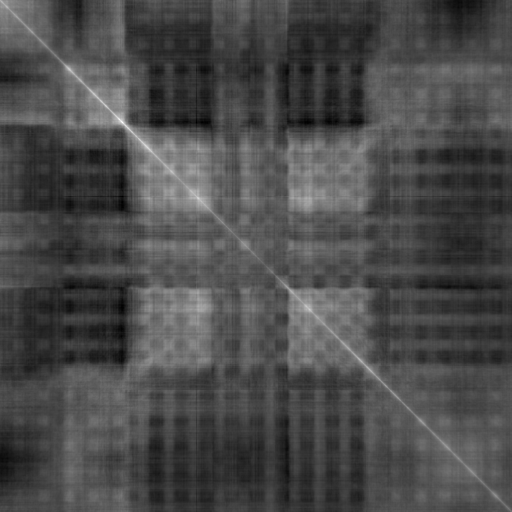

In [49]:
Gray.(value3(changing_m))

In [50]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

7.60057841848513
7.485253649768645
7.372996863136393
7.263589150466054
7.157216462751489
7.0544030237610205
6.955449895390382
6.860140223171017
6.768078655600789
6.67915067588853
6.593464428632479
6.510926595765651
6.431123878655055
6.353675043417407
6.278491739756081
6.205564346065731
6.134653520701552
6.065386479983967
5.997573719248377
5.931224440629821
5.8662782986153195
5.802533923802049
5.739868224085076
5.678327332338091
5.617932376518945
5.558564128945125
5.5001191522505515
5.442623293375931
5.386099145349373
5.330460178888446


5.330460178888446

In [51]:
length(m_list)

90

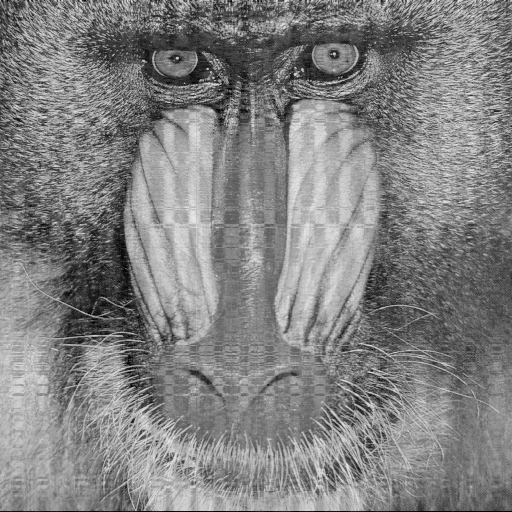

In [52]:
Gray.(changing_m)

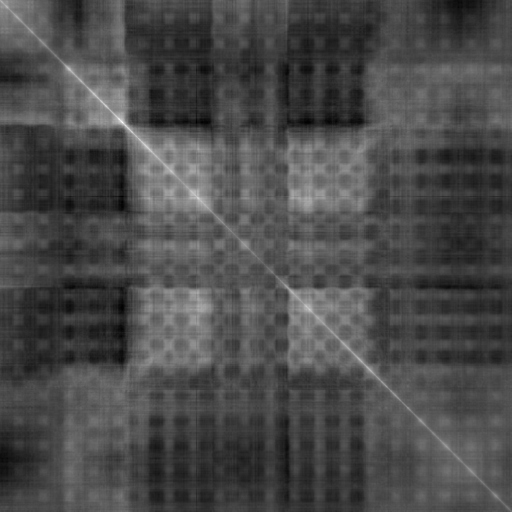

In [53]:
Gray.(value3(changing_m))

In [54]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

5.2756227725355
5.221590964080532
5.168350610464851
5.115805157327779
5.06388145620981
5.012579404017418
4.961875952625048
4.911700205572438
4.862021709936496
4.812850661552105
4.764161376723897
4.715916362808021
4.668127272108531
4.62081202429177
4.573953543814768
4.527548613383197
4.4816194316753455
4.4361641033991175
4.391169835642275
4.346648865394549
4.302606259057592
4.259024593947315
4.215899795956537
4.173233138498711
4.131007434250898
4.089212024281403
4.04784686249074
4.0068978222550165
3.9663517280538336
3.926206728742082


3.926206728742082

In [55]:
length(m_list)

120

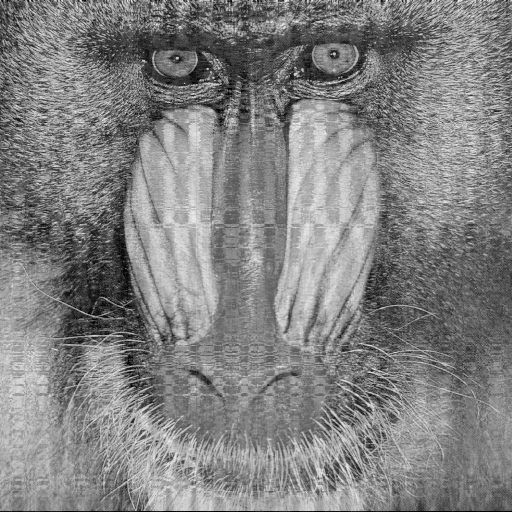

In [56]:
Gray.(changing_m)

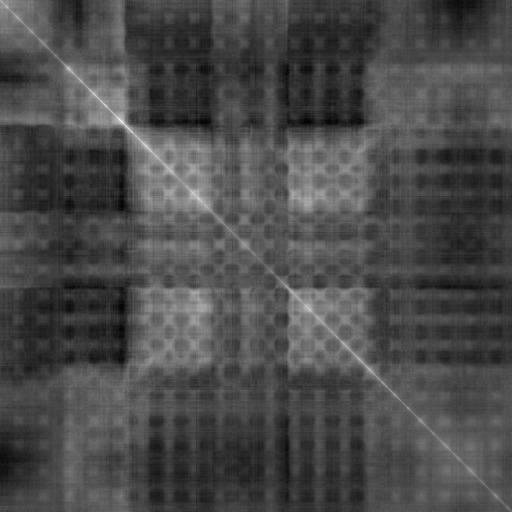

In [57]:
Gray.(value3(changing_m))

In [58]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

3.886452267645231
3.8470777572721144
3.808082055682141
3.7694565007683734
3.731191531385484
3.6932849407569757
3.655728528410008
3.6185144285590236
3.5816394594031458
3.5450944888648284
3.5088722243692487
3.4729682593635736
3.4373738292018396
3.402083366748691
3.3670913248428764
3.332389496348246
3.2979734009035155
3.263836929850558
3.2299738834202247
3.1963800522702934
3.163048789997122
3.1299753859585757
3.0971549798809375
3.064581859485647
3.032251945843567
3.000159600719575
2.968300488336218
2.9366702781093688
2.905264354734936
2.874079198597287


2.874079198597287

In [59]:
length(m_list)

150

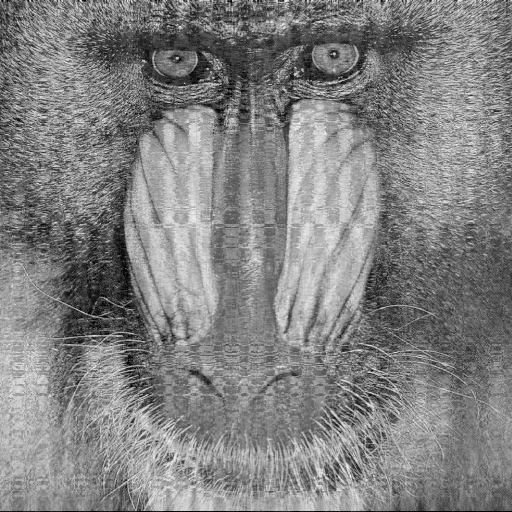

In [60]:
Gray.(changing_m)

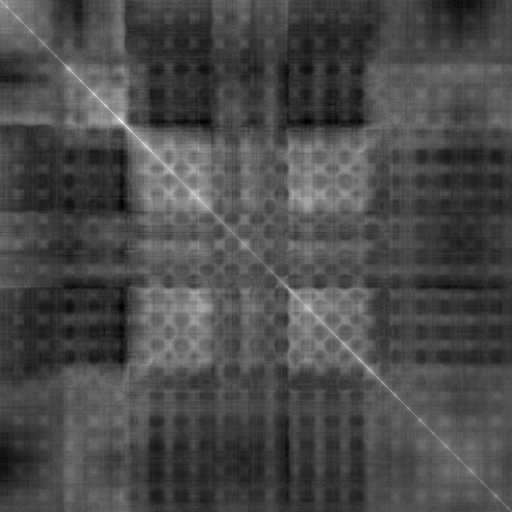

In [61]:
Gray.(value3(changing_m))

In [62]:
steps!(changing_m, target_value, loss, opt, m_list, 300)

2.8431104124057547
2.812354871250584
2.781809066717543
2.7514699558137052
2.7213347380498343
2.6914005028905312
2.661665100494834
2.632125993297167
2.602781362306213
2.573629056406833
2.5446675801741097
2.515895309933134
2.487311024092727
2.4589134972780227
2.4306988022300966
2.402667792728044
2.3749657398392436
2.347194238543003
2.319821443676803
2.2924397880851153
2.265408904675374
2.238419555961878
2.2117244820817374
2.185130368761567
2.158765522395117
2.1325702612560757
2.10653514752134
2.0807341643646557
2.055040552106634
2.029616357140783
2.004290715422341
1.9792142066569558
1.9542861004308032
1.9295401123722375
1.9050114961087228
1.880617585042014
1.8564526157686894
1.832453348359823
1.8086274829373223
1.78501977027047
1.761569842797556
1.738311474460497
1.7152595998177975
1.6923732515562186
1.6696781692573288
1.647188052961886
1.6248744474136665
1.6027442652891333
1.580817271803134
1.5590828448730882
1.5375296415042523
1.5161668809770148
1.495004036399548
1.4740376015512566
1.4

0.25856242445265354

In [63]:
# we now see the difference with Float32 (the loss was 0.1872 there at this point)

In [64]:
length(m_list)

450

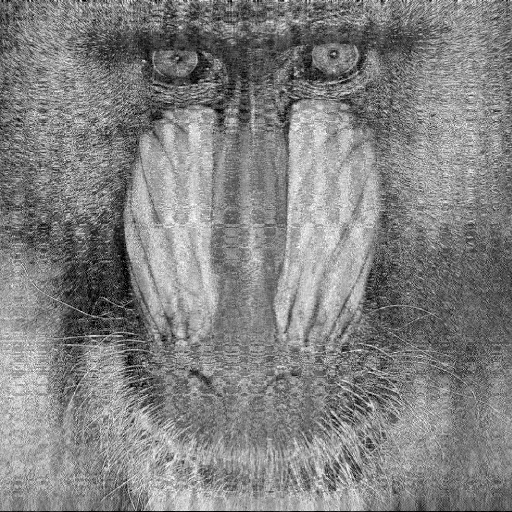

In [65]:
Gray.(changing_m)

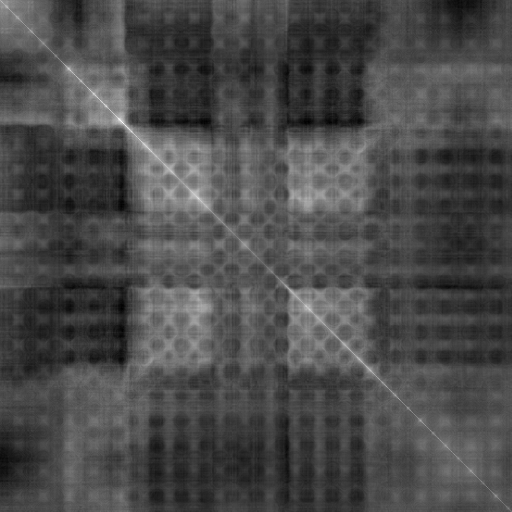

In [66]:
Gray.(value3(changing_m))

In [67]:
steps!(changing_m, target_value, loss, opt, m_list, 3000)

0.2593524780612781
0.2919718522937221
0.34122742439823256
0.302696644527771
0.261995110677503
0.2587030088378968
0.28963110708384504
0.3272080506767226
0.2901105540079885
0.25818131137215783
0.26244436118939424
0.2976014033701909
0.3097064529157989
0.270635964828277
0.2545775557868788
0.27211189175915795
0.3019040164015031
0.28311740116871836
0.2560805061110165
0.25912925872469345
0.284998342565184
0.28700398435900143
0.2600141820153252
0.25271912582286377
0.2708510785864253
0.2832253876136261
0.2628970311413534
0.2499448871841941
0.26070591884474775
0.2759688481109661
0.26368446537495105
0.24878882531033705
0.25364215254603556
0.2679655340672718
0.2624833722117985
0.24800265235412425
0.2486303097571263
0.26059749242410757
0.2597695666518427
0.24709952252967188
0.24486850478641475
0.2543042865726977
0.2561187687804272
0.24579799816987846
0.2419317588362036
0.2490001348684237
0.2521198078961329
0.24404960889446456
0.23944108007694467
0.24454910419333054
0.24805539050551553
0.24195850299

0.15046912835084694
0.15026436165065088
0.15028145232082965
0.15007714504274708
0.150094993823702
0.14989114127635225
0.1499097417930416
0.14970633894302143
0.14972568524874696
0.1495227270609395
0.149542813364339
0.14934029449922823
0.1493611157784396
0.14915903030300892
0.1491805824298861
0.14897892385055794
0.14900120404667735
0.14879996467166845
0.14882297305623354
0.14862214373205196
0.14864588523781352
0.1484454557273661
0.14846994575264558
0.14826990692182407
0.1482951843454534
0.14809553958706614
0.14812170154448065
0.14792250662430467
0.14794980702170596
0.1477513030496948
0.14778043869343332
0.14758346593497104
0.14761639229411663
0.14742351163380832
0.14746540214801282
0.14728262448618157
0.14734310331880138
0.1471717510878913
0.14723800587063382
0.146992451881077
0.14689615048168103
0.14630693864470687
0.14600845322711903
0.1457050104767628
0.14642121115479806
0.1471688704812663
0.14754855492812205
0.14694835276606535
0.14629583079109135
0.14539366091800474
0.14501555689909

0.1275269065234117
0.12761561832743681
0.12746903558825431
0.12755126221743318
0.12740429100224598
0.12749172427660707
0.12733912370557693
0.1274274968350911
0.12728066459062937
0.1273644323113752
0.12721718230655713
0.12730475216204187
0.1271542314177002
0.12724137604979935
0.12709525722828027
0.12717987896908872
0.12703252774607776
0.1271206518113447
0.12697097661711218
0.12705832646142873
0.1269120030861256
0.1269977778449822
0.12685051785508858
0.12693867041523307
0.1267903508773116
0.12687735113167634
0.126731536453267
0.1268178259023825
0.1266709352446555
0.12675925295091126
0.12661167961179265
0.1266990690025187
0.12655321637963346
0.1266403288730791
0.12649367112520654
0.12658212314077077
0.1264354008991024
0.1265228903474212
0.12637747864706503
0.1264649213952723
0.12631882051321094
0.1264073110355112
0.1262612591231894
0.1263491088728196
0.12620387817326628
0.12629189609501812
0.12614611586394378
0.1262348374799842
0.12608932183079574
0.12617747871617047
0.12603262878257573
0

0.11880201068063562
0.11867607332153175
0.11877302202412725
0.11864712411068691
0.11874413174733847
0.11861828955393156
0.11871531344152242
0.11858955569914299
0.11868660207233618
0.11856089809270177
0.11865798791423295
0.11853234510464633
0.11862945224891121
0.1185038871578746
0.11860102094793536
0.11847550717928956
0.11857268669808477
0.11844722661668411
0.11854443512368441
0.11841903890585675
0.11851628399761667
0.11839093183375751
0.11848822712487436
0.11836292108965624
0.11846025316720131
0.11833500205692575
0.11843237470857898
0.11830716575745767
0.11840458702057419
0.11827942377821125
0.11837688177837623
0.11825177263171859
0.11834926831551622
0.11822420574041231
0.11832174324373985
0.11819673137346312
0.11829430065553613
0.11816934684829253
0.11826694735699199
0.1181420471355584
0.11823968095667788
0.11811483809222954
0.11821249714198198
0.11808771756770026
0.11818540080869734
0.1180606817554124
0.11815839017197309
0.1180337347007495
0.11813146196592166
0.1180068747452181
0.118

0.11434562488715162
0.11430354931208564
0.1144590676789573
0.11435484290824781
0.11445209361730084
0.1142877456058565
0.11434520180436623
0.11423241452076355
0.11435851417263675
0.11426118075741608
0.11439227877310905
0.11426692965981822
0.11433625859691963
0.11421221691589685
0.11430125905947523
0.11419133810479017
0.11431392120718419
0.11420737447013093
0.11430228319179583
0.1141829986305133
0.11427144070589199
0.11414377147021376
0.11425463009313078
0.11414198499343409
0.11424725396687266
0.11413804971631958
0.1142326548532426
0.11410927997823832
0.11420853260850057
0.11409136398172415
0.11419102539946817
0.11408382279978237
0.11418388980795856
0.11406620495921006
0.11416790587418897
0.1140467776718778
0.11414532966909306
0.1140317179851396
0.11413274697425654
0.11401713922781752
0.1141208916724156
0.11400314632842226
0.11410118482817097
0.11398685571835174
0.11408445046534453
0.11396932109251454
0.11407143862890025
0.11395570053500644
0.11405575254979765
0.11394126417322131
0.11404

0.11181863322065161
0.11170752304843624
0.11180845689639575
0.1116973431754091
0.1117982904685137
0.11168717327643204
0.11178817134715659
0.11167701159191691
0.11177806521651644
0.11166689367595971
0.11176796627860959
0.11165679355994292
0.11175790496706607
0.11164670493508487
0.11174786011854515
0.1116366553336849
0.11173782373541293
0.11162662857183787
0.1117278194078572
0.11161661618299165
0.1117178347372702
0.11160663851421516
0.11170786097923938
0.11159668610741026
0.11169791569649783
0.11158675001433023
0.11168799214930786
0.11157684494865241
0.11167808193084612
0.11156696589009056
0.11166819758535344
0.11155710462366886
0.11165833595090313
0.11154727144236871
0.1116484894710796
0.11153746424554462
0.11163866668650764
0.11152767593959648
0.11162886658630793
0.11151791350647995
0.11161908261635585
0.11150817663027783
0.11160932031676325
0.11149845951690655
0.1115995797173897
0.11148876683813125
0.11158985539787511
0.11147909937275034
0.11158015063426863
0.1114694529192281
0.111570

0.11267965613598073
0.1127534422434574
0.11267579359313468
0.11275413208425557
0.11266904301467284
0.11274944946908723
0.112668974639213
0.11274391723100004
0.11266331273272084
0.11274341091659165
0.11265831928280123
0.11273757081592536
0.11265682527205856
0.11273341516105585
0.11265054300950518
0.11273140327869721
0.11264655329314704
0.11272533010880023
0.11264360431305188
0.11272180813546147
0.1126373694552955
0.11271845310178824
0.11263371423418088
0.11271258380453167
0.11262959227446163
0.11270912872382483
0.11262365328140299
0.11270477980849421
0.11261987222205411
0.11269921636525444
0.11261494565048474
0.11269548145681581
0.11260930197802167
0.1126904846275659
0.11260515182213819
0.11268516297636222
0.11259972500403209
0.11268099557453433
0.11259427124872885
0.11267560907798942
0.1125896723376916
0.11267040099923603
0.11258395728953396
0.1126657782521769
0.11257855863459917
0.11266016911208192
0.11257352565573198
0.11265494930046566
0.11256764794173106
0.11264991067174102
0.11256

0.11609670901150239
0.11244712483990538
0.11340065522370893
0.11650612418688883
0.11720166655222969
0.11562252785268627
0.11496813741549555
0.11556546517156552
0.11560566096506042
0.11529042827269459
0.11587375610115075
0.1166710796629676
0.1158683167369868
0.11464048038455552
0.11513551746463596
0.11686268231088857
0.11683474291026194
0.11513552799065417
0.11466744683892097
0.11621273148282965
0.11706293995253245
0.115896967490152
0.11494512901167818
0.1158226477636545
0.1167429361267839
0.1161800726358223
0.11539976545578247
0.1159072221335255
0.1165080697375175
0.11610933551063826
0.11562521945104604
0.1161295774631868
0.11649797902296317
0.11603941220644705
0.11569147770082586
0.11625553673021055
0.11653752984815072
0.116062863530509
0.1157830052262116
0.116313373244982
0.11650363577195658
0.11610149942154885
0.11593767551611572
0.11638535064139398
0.11642227526900674
0.11610865926317547
0.11610094392254469
0.11646757848886388
0.1163511125170579
0.1161194968839751
0.116235368792289

0.11654941586277016

In [68]:
length(m_list)

3450

In [71]:
# Compute losses and store values with indices
losses_with_indices = [(loss(x, target_value), i) for (i, x) in enumerate(m_list)]

# Sort by loss value and take the five smallest
sorted_losses = sort(losses_with_indices, by = first)
five_smallest = sorted_losses[1:5]

# Print the five smallest losses with their indices
for (loss_value, index) in five_smallest
    println("Index: ", index, ", loss_value ", loss_value)
end

Index: 2780, loss_value 0.09613253247624647
Index: 2779, loss_value 0.09906232314272377
Index: 2784, loss_value 0.09931354536881556
Index: 2785, loss_value 0.10292940202264078
Index: 2773, loss_value 0.10441172471495082
